In [1]:
import pickle
import json
import os
import re
import sys
from copy import deepcopy
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
import tifffile
import yaml
from einops import rearrange, repeat

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
from mushroom.mushroom import Mushroom, DEFAULT_CONFIG
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.multiplex as multiplex
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.cosmx as cosmx

In [6]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [7]:
run_dir = '/data/estorrs/mushroom/data/projects/submission_v1'

In [8]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
        
    return config

In [9]:
# case = 'HT913Z1'
case = 'HT891Z1'
# case = 'HT704B1'
# case = 'HT206B1'
# case = 'HT397B1'
# case = 'HT413C1-Th1k4A1'

In [10]:
project_dir = f'/data/estorrs/mushroom/data/projects/submission_v1/{case}'

In [11]:
config = yaml.safe_load(open(os.path.join(project_dir, 'registered', 'metadata.yaml')))
config = alter_filesystem(config, source_root, target_root)
config

{'resolution': 1.0,
 'sections': [{'data': [{'dtype': 'xenium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/registered/s0_HT891Z1-U1_xenium.h5ad'}],
   'position': 0,
   'sid': 'HT891Z1-U1'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/registered/s1_HT891Z1-U4_he.tif'}],
   'position': 15,
   'sid': 'HT891Z1-U4'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/registered/s2_HT891Z1-U5_he.tif'}],
   'position': 20,
   'sid': 'HT891Z1-U5'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/registered/s3_HT891Z1-U6_he.tif'}],
   'position': 25,
   'sid': 'HT891Z1-U6'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/registered/s4_HT891Z1-U7_he.tif'}],
   'position': 30,
   'sid': 'HT891Z1-U7'},
  {'data': [{'dtype': 'multiplex',


In [12]:
fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype']=='multiplex']
multiplex_channels = multiplex.get_common_channels(fps)
multiplex_channels

['AMACR',
 'AR',
 'CD20',
 'CD31',
 'CD3e',
 'CD4',
 'CD44',
 'CD45(D)',
 'CD68',
 'CD8',
 'CK14',
 'CK5',
 'CK7',
 'DAPI',
 'E-Cadherin',
 'Foxp3',
 'HLA-DR',
 'Ki67',
 'LYVE1',
 'Pan-Cytokeratin',
 'Podoplanin',
 'SMA (D)',
 'STEAP4',
 'Vimentin',
 'p63']

In [13]:
multiplex_view_settings = [
    {
        'channel': 'E-Cadherin',
        'color': 'red',
        'min_value': 15,
        'max_value': 100,
        'gamma': 1.
    },
#     {
#         'channel': 'Pan-Cytokeratin',
#         'color': 'red',
#         'min_value': 15,
#         'max_value': 100,
#         'gamma': 1.
#     },
    {
        'channel': 'HLA-DR',
        'color': 'magenta',
        'min_value': 15,
        'max_value': 255,
        'gamma': 1.
    },
    {
        'channel': 'CK5',
        'color': 'white',
        'min_value': 15,
        'max_value': 255,
        'gamma': 1.
    },
#     {
#         'channel': 'Keratin 14',
#         'color': 'white',
#         'min_value': 10,
#         'max_value': 30,
#         'gamma': 1.
#     },
#     {
#         'channel': 'SMA (D)',
#         'color': 'white',
#         'min_value': 15,
#         'max_value': 255,
#         'gamma': 1.
#     },
    {
        'channel': 'CD3e',
        'color': 'green',
        'min_value': 20,
        'max_value': 75,
        'gamma': 1.
    },
#     {
#         'channel': 'CD45 (D)',
#         'color': 'green',
#         'min_value': 10,
#         'max_value': 20,
#         'gamma': 1.
#     },
    {
        'channel': 'CD68',
        'color': 'cyan',
        'min_value': 15,
        'max_value': 255,
        'gamma': 1.
    },
]

def get_multiplex_pseudo(fp, view_settings):
    channels = [x['channel'] for x in view_settings]
    colors = [x['color'] for x in view_settings]
    min_values = [x['min_value'] for x in view_settings]
    max_values = [x['max_value'] for x in view_settings]
    gammas = [x['gamma'] for x in view_settings]
    
    channel_to_img = multiplex.extract_ome_tiff(fp, as_dict=True)
    data = np.stack([channel_to_img[x] for x in channels])
    
    rgb = multiplex.to_pseudocolor(
        data,
        colors=colors,
        min_values=min_values,
        max_values=max_values,
        gammas=gammas
    )
    
    rgb *= 255.
    rgb = rgb.astype(np.uint8)
    
    return rgb

In [14]:
xenium_view_settings = [
    {
        'channel': 'EPCAM',
        'color': 'red',
        'min_value': 0,
        'max_value': 20,
        'gamma': 1.
    },
#     {
#         'channel': 'HLA-DQB2',
#         'color': 'magenta',
#         'min_value': 0,
#         'max_value': 50,
#         'gamma': 1.
#     },
    {
        'channel': 'TP63',
        'color': 'white',
        'min_value': 0,
        'max_value': 20,
        'gamma': 1.
    },
    {
        'channel': 'KRT5',
        'color': 'white',
        'min_value': 0,
        'max_value': 20,
        'gamma': 1.
    },
#     {
#         'channel': 'ACTA2',
#         'color': 'white',
#         'min_value': 0,
#         'max_value': 20,
#         'gamma': 1.
#     },
    {
        'channel': 'CP',
        'color': 'cyan',
        'min_value': 0,
        'max_value': 30,
        'gamma': 1.
    },
    {
        'channel': 'CD3E',
        'color': 'green',
        'min_value': 0,
        'max_value': 30,
        'gamma': 1.
    },
    {
        'channel': 'CD68',
        'color': 'magenta',
        'min_value': 0,
        'max_value': 30,
        'gamma': 1.
    },
]

def tile_xenium(adata, target_size=None, tile_size=20):
    if target_size is None:
        target_size = xenium.get_fullres_size(adata)
    
    adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]
    df = pd.DataFrame(data=adata.X, columns=adata.var.index.to_list(), index=adata.obs.index.to_list())
    df['grid_name'] = adata.obs['grid_name'].to_list()
    df = df.groupby('grid_name').sum()
    
    img = np.zeros((target_size[0] // tile_size + 1, target_size[1] // tile_size + 1, df.shape[1]))
    for name, row in df.iterrows():
        x, y = [int(x) for x in name.split('_')]
        img[y, x] = row.values
    return img
    

def get_xenium_pseudo(fp, view_settings, tile_size=20, target_size=None):
    channels = [x['channel'] for x in view_settings]
    colors = [x['color'] for x in view_settings]
    min_values = [x['min_value'] for x in view_settings]
    max_values = [x['max_value'] for x in view_settings]
    gammas = [x['gamma'] for x in view_settings]
    
    adata = xenium.adata_from_xenium(fp)
    if target_size is None:
        target_size = xenium.get_fullres_size(adata)
    
    img = tile_xenium(adata, tile_size=tile_size)
    
    both = set(channels).intersection(set(adata.var.index.to_list()))
    missing = set(channels) - both
    print('missing', missing)
    data = np.zeros((img.shape[0], img.shape[1], len(channels)), dtype=img.dtype)
    for channel in both:
        idx = channels.index(channel)
        data[..., channels.index(channel)] = img[..., adata.var.index.to_list().index(channel)]
    for channel in missing:
        idx = channels.index(channel)
        data[..., channels.index(channel)] = np.zeros_like(img[..., 0])
        data[0, 0, idx] = 1.
        
    
    data -= data.min((0, 1))
    data /= data.max((0, 1))
    data *= 255.
    data = data.astype(np.uint8)
    data = rearrange(data, 'h w c -> c h w')
    
    rgb = multiplex.to_pseudocolor(
        data,
        colors=colors,
        min_values=min_values,
        max_values=max_values,
        gammas=gammas
    )
    rgb = utils.rescale(rgb, size=target_size, dim_order='h w c', target_dtype=rgb.dtype)
    
    rgb *= 255.
    rgb = rgb.astype(np.uint8)
#     plt.imshow(rgb[4000:4500, 4000:4500])
#     plt.show()
    
    return rgb

In [15]:
target_size = xenium.get_fullres_size(xenium.adata_from_xenium(config['sections'][0]['data'][0]['filepath']))
# target_size = tifffile.imread(config['sections'][1]['data'][0]['filepath']).shape[1:]
# target_size = [int(x * .5) for x in target_size]
target_size

(6530, 7258)

In [16]:
imaris_dir = Path(os.path.join(project_dir, 'imaris'))
imaris_dir.mkdir(parents=True, exist_ok=True)
imaris_dir

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris')

In [19]:
z_rgb_dir = imaris_dir / 'pseudos_rgb_zlabeled'
sids_rgb_dir = imaris_dir / 'pseudos_rgb_sids'

z_rgb_dir.mkdir(parents=True, exist_ok=True)
sids_rgb_dir.mkdir(parents=True, exist_ok=True)

rgbs = []
for i, section in enumerate(config['sections']):
    print(i, section['sid'])
    sid = section['sid']
    for entry in section['data']:
        dtype = entry['dtype']
        fp = entry['filepath']
        position = section['position']

        if dtype in ['he', 'batch2_he']: 
            rgb = tifffile.imread(fp)
        elif dtype == 'xenium':
            rgb = get_xenium_pseudo(
                fp,
                xenium_view_settings,
                tile_size=10,
                target_size=target_size,
            )
        elif dtype == 'multiplex':
            rgb = get_multiplex_pseudo(
                fp,
                multiplex_view_settings
            )
        else:
            rgb = None


        if rgb is not None:
            if rgb.shape[:2] != target_size:
                rgb = utils.rescale(rgb, size=target_size, dim_order='h w c', target_dtype=rgb.dtype)
            print(rgb.shape)
            rgbs.append(rgb)
            tifffile.imwrite(sids_rgb_dir / f's{i}_{sid}.tif', rgb, compression='LZW', ome=True, bigtiff=True)
            tifffile.imwrite(z_rgb_dir / f'case_Z{position}.tif', rgb, compression='LZW')

0 HT891Z1-U1
missing {'TP63'}
(6530, 7258, 3)
1 HT891Z1-U4
(6530, 7258, 3)
2 HT891Z1-U5
(6530, 7258, 3)
3 HT891Z1-U6
(6530, 7258, 3)
4 HT891Z1-U7
(6530, 7258, 3)
5 HT891Z1-U14
(6530, 7258, 3)
6 HT891Z1-U21
missing {'TP63'}
(6530, 7258, 3)
7 HT891Z1-U28
(6530, 7258, 3)
8 HT891Z1-U29
(6530, 7258, 3)
9 HT891Z1-U30
(6530, 7258, 3)
10 HT891Z1-U31
missing {'TP63'}
(6530, 7258, 3)
11 HT891Z1-U32
(6530, 7258, 3)
12 HT891Z1-U35
(6530, 7258, 3)
13 HT891Z1-U40
(6530, 7258, 3)
14 HT891Z1-U41
(6530, 7258, 3)
15 HT891Z1-U43
(6530, 7258, 3)
16 HT891Z1-U44
missing {'TP63'}
(6530, 7258, 3)
17 HT891Z1-U45
(6530, 7258, 3)
18 HT891Z1-U46
(6530, 7258, 3)
19 HT891Z1-U47
(6530, 7258, 3)
20 HT891Z1-U48
(6530, 7258, 3)
21 HT891Z1-U49
(6530, 7258, 3)
22 HT891Z1-U50
(6530, 7258, 3)
23 HT891Z1-U58
(6530, 7258, 3)
24 HT891Z1-U59
missing {'TP63'}
(6530, 7258, 3)
25 HT891Z1-U66
(6530, 7258, 3)
26 HT891Z1-U68
(6530, 7258, 3)
27 HT891Z1-U69
missing {'TP63'}
(6530, 7258, 3)
28 HT891Z1-U70
(6530, 7258, 3)
29 HT891Z1-U79

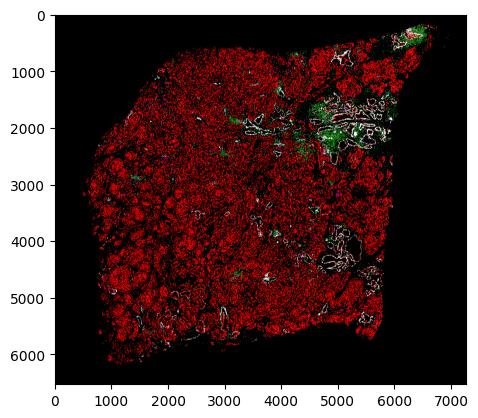

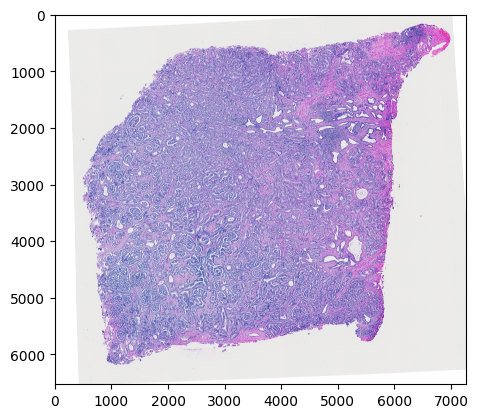

In [18]:
for rgb in rgbs:
    plt.imshow(rgb)
    plt.show()

## combined 

In [57]:
combined_dir = imaris_dir / 'combined'
combined_dir.mkdir(parents=True, exist_ok=True)
root = 'image'
combined_channels = []
combined_channel_idx = 0 # imaris is one indexed

In [58]:
sid_to_z = {entry['sid']: entry['position'] for entry in config['sections']}
# sid_to_idx = {entry['sid']: i for i, entry in enumerate(config['sections'])}

In [59]:
target_size

(6534, 8461)

#### predicted multiplex

In [22]:
# save all channels

predicted_dir = os.path.join(project_dir, 'multiplex_prediction')
predicted_fps = sorted(utils.listfiles(predicted_dir))
sid_to_predicted_fp = {re.sub(r'^.*s[0-9]+_(.*).ome.tif$', r'\1', fp):fp
                      for fp in predicted_fps}
predicted_channels = multiplex.get_ome_tiff_channels(next(iter(sid_to_predicted_fp.values())))
channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(predicted_channels)}

predicted_channels, sid_to_predicted_fp.keys()

StopIteration: 

In [25]:
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    if sid in sid_to_predicted_fp:
        fp = sid_to_predicted_fp[sid]
        d = multiplex.extract_ome_tiff(fp)
        for channel, img in d.items():
            c_idx = channel_to_idx[channel]
            if img.shape != target_size:
                img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
            save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
            tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

HT704B1-U1
HT704B1-U11
HT704B1-U12
HT704B1-U14
HT704B1-U15
HT704B1-U17
HT704B1-U19
HT704B1-U20
HT704B1-U22
HT704B1-U23
HT704B1-U26
HT704B1-U27
HT704B1-U28
HT704B1-U31
HT704B1-U33
HT704B1-U35
HT704B1-U36
HT704B1-U39
HT704B1-U41
HT704B1-U43
HT704B1-U44
HT704B1-U47
HT704B1-U48
HT704B1-U50
HT704B1-U53
HT704B1-U54
HT704B1-U56
HT704B1-U57
HT704B1-U60
HT704B1-U61
HT704B1-U65
HT704B1-U68
HT704B1-U69
HT704B1-U73
HT704B1-U76
HT704B1-U81
HT704B1-U82
HT704B1-U84
HT704B1-U85
HT704B1-U90
HT704B1-U91
HT704B1-U93


In [26]:
combined_channels += [f'predicted_multiplex_{x}' for x in predicted_channels]
combined_channel_idx += len(predicted_channels)

In [27]:
combined_channel_idx

5

#### multiplex

In [28]:
multiplex_fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype'] == 'multiplex']
# multiplex_channels = multiplex.get_common_channels(multiplex_fps)
multiplex_channels = [
    'Pan-Cytokeratin',
    'Keratin 5',
    'CD68'
]
channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(multiplex_channels)}
channel_to_idx

{'Pan-Cytokeratin': 5, 'Keratin 5': 6, 'CD68': 7}

In [29]:
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'multiplex':
            d = multiplex.extract_ome_tiff(data['filepath'], channels=multiplex_channels)
            for channel, img in d.items():
                assert img.dtype == np.uint8
                c_idx = channel_to_idx[channel]
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

HT704B1-U1
HT704B1-U11
HT704B1-U12
HT704B1-U14
HT704B1-U15
HT704B1-U17
HT704B1-U19
HT704B1-U20
HT704B1-U22
HT704B1-U23
HT704B1-U26
HT704B1-U27
HT704B1-U28
HT704B1-U31
HT704B1-U33
HT704B1-U35
HT704B1-U36
HT704B1-U39
HT704B1-U41
HT704B1-U43
HT704B1-U44
HT704B1-U47
HT704B1-U48
HT704B1-U50
HT704B1-U53
HT704B1-U54
HT704B1-U56
HT704B1-U57
HT704B1-U60
HT704B1-U61
HT704B1-U65
HT704B1-U68
HT704B1-U69
HT704B1-U73
HT704B1-U76
HT704B1-U81
HT704B1-U82
HT704B1-U84
HT704B1-U85
HT704B1-U90
HT704B1-U91
HT704B1-U93


In [30]:
combined_channels += [f'multiplex_{x}' for x in multiplex_channels]
combined_channel_idx += len(multiplex_channels)
combined_channel_idx

8

#### xenium

In [31]:
xenium_fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype'] == 'xenium']
xenium_pool = xenium.get_common_channels(xenium_fps)
xenium_pool

['ABCC11',
 'ACE2',
 'ACKR1',
 'ACTA2',
 'ACTG2',
 'ADAM28',
 'ADAM8',
 'ADAMTS1',
 'ADGRE1',
 'ADGRL4',
 'ADH1C',
 'ADH4',
 'ADIPOQ',
 'AGER',
 'AGR3',
 'AHSP',
 'AIF1',
 'ALAS2',
 'ALDH1A3',
 'AMACR',
 'AMY2A',
 'ANGPT2',
 'ANPEP',
 'APCDD1',
 'APOA5',
 'APOBEC3A',
 'APOD',
 'APOLD1',
 'AQP2',
 'AQP3',
 'AQP4',
 'AQP8',
 'AQP9',
 'AR',
 'ARFGEF3',
 'ASCL1',
 'ASCL3',
 'ASPN',
 'BAMBI',
 'BANK1',
 'BAP1',
 'BASP1',
 'BBOX1',
 'BCL2L11',
 'BMX',
 'BTNL9',
 'C15orf48',
 'C1orf162',
 'C1orf194',
 'C20orf85',
 'C3',
 'C3AR1',
 'C5AR1',
 'C5orf46',
 'C6orf118',
 'C7',
 'CA4',
 'CA9',
 'CAPN8',
 'CAV1',
 'CAVIN1',
 'CAVIN2',
 'CCDC39',
 'CCDC78',
 'CCL19',
 'CCL2',
 'CCL27',
 'CCL5',
 'CCNB2',
 'CCR2',
 'CCR7',
 'CD14',
 'CD163',
 'CD19',
 'CD1A',
 'CD1C',
 'CD1E',
 'CD2',
 'CD200R1',
 'CD247',
 'CD27',
 'CD274',
 'CD28',
 'CD300E',
 'CD34',
 'CD3D',
 'CD3E',
 'CD4',
 'CD44',
 'CD5L',
 'CD68',
 'CD69',
 'CD70',
 'CD74',
 'CD79A',
 'CD83',
 'CD86',
 'CD8A',
 'CD93',
 'CDH12',
 'CDH16',
 'CDK

In [32]:
xenium_channels = [
    'EPCAM',
    'KRT5',
#     'PECAM1',
#     'CD4',
#     'CD8A',
#     'CD3E',
    'CD68',
#     'CD163',
#     'MS4A1',
#     'PTPRC',
    'ACTA2',
]
common = set(xenium_channels).intersection(set(xenium_pool))
missing = set(xenium_channels) - common
assert len(missing) == 0

In [33]:
channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(xenium_channels)}
channel_to_idx

{'EPCAM': 8, 'KRT5': 9, 'CD68': 10, 'ACTA2': 11}

In [34]:
tile_size = 10

In [35]:
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'xenium':
            
            adata = xenium.adata_from_xenium(data['filepath'])
#             adata = adata[:, xenium_channels]
#             data = tile_xenium(adata, tile_size=tile_size) # return (h, w, c)
            
            img = tile_xenium(adata, tile_size=tile_size) # return (h, w, c)
            both = set(xenium_channels).intersection(set(adata.var.index.to_list()))
            missing = set(xenium_channels) - both
            data = np.zeros((img.shape[0], img.shape[1], len(xenium_channels)), dtype=img.dtype)
            for channel in both:
                idx = xenium_channels.index(channel)
                data[..., xenium_channels.index(channel)] = img[..., adata.var.index.to_list().index(channel)]
            for channel in missing:
                idx = xenium_channels.index(channel)
                data[..., xenium_channels.index(channel)] = np.zeros_like(img[..., 0])
                data[0, 0, idx] = 1.

    
            data = rearrange(data, 'h w c -> c h w')
            # blur looks better
            data = np.stack([skimage.filters.gaussian(x) for x in data])
            data -= rearrange(data.min((-2, -1)), 'n -> n 1 1')
            data /= rearrange(data.max((-2, -1)), 'n -> n 1 1')
            data *= 255.
            data = data.astype(np.uint8)
            
            for channel, img in zip(xenium_channels, data):
                c_idx = channel_to_idx[channel]
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

HT704B1-U1


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U11
HT704B1-U12
HT704B1-U14
HT704B1-U15
HT704B1-U17


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U19
HT704B1-U20
HT704B1-U22
HT704B1-U23
HT704B1-U26


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U27
HT704B1-U28
HT704B1-U31
HT704B1-U33


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U35
HT704B1-U36
HT704B1-U39
HT704B1-U41


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U43
HT704B1-U44
HT704B1-U47
HT704B1-U48
HT704B1-U50


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U53
HT704B1-U54
HT704B1-U56
HT704B1-U57
HT704B1-U60
HT704B1-U61
HT704B1-U65
HT704B1-U68
HT704B1-U69
HT704B1-U73
HT704B1-U76
HT704B1-U81
HT704B1-U82
HT704B1-U84
HT704B1-U85
HT704B1-U90
HT704B1-U91
HT704B1-U93


In [36]:
combined_channels += [f'xenium_{x}' for x in xenium_channels]
combined_channel_idx += len(xenium_channels)
combined_channel_idx

12

#### cosmx

In [37]:
cosmx_fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype'] == 'cosmx']
cosmx_pool = cosmx.get_common_channels(cosmx_fps)
cosmx_pool

['AATK',
 'ABL1',
 'ABL2',
 'ACACB',
 'ACE',
 'ACKR1',
 'ACKR3',
 'ACKR4',
 'ACP5',
 'ACTA2',
 'ACTG2',
 'ACVR1',
 'ACVR1B',
 'ACVR2A',
 'ACVRL1',
 'ADGRA2',
 'ADGRA3',
 'ADGRE2',
 'ADGRE5',
 'ADGRF1',
 'ADGRF3',
 'ADGRF5',
 'ADGRG1',
 'ADGRG3',
 'ADGRG5',
 'ADGRG6',
 'ADGRL1',
 'ADGRL2',
 'ADGRL4',
 'ADGRV1',
 'ADIPOQ',
 'ADIRF',
 'ADM2',
 'AGR2',
 'AHI1',
 'AHR',
 'AIF1',
 'AKT1',
 'ALCAM',
 'ALOX5AP',
 'ANGPT1',
 'ANGPT2',
 'ANGPTL1',
 'ANKRD1',
 'ANXA1',
 'ANXA2',
 'ANXA4',
 'APOA1',
 'APOC1',
 'APOD',
 'APOE',
 'APP',
 'AQP3',
 'AR',
 'AREG',
 'ARF1',
 'ARG1',
 'ARHGDIB',
 'ARID5B',
 'ATF3',
 'ATG10',
 'ATG12',
 'ATG5',
 'ATM',
 'ATP5F1B',
 'ATP5F1E',
 'ATR',
 'AXL',
 'AZGP1',
 'AZU1',
 'B2M',
 'B3GNT7',
 'BAG3',
 'BASP1',
 'BAX',
 'BBLN',
 'BCL2',
 'BCL2L1',
 'BECN1',
 'BEST1',
 'BGN',
 'BID',
 'BIRC3',
 'BIRC5',
 'BMP1',
 'BMP2',
 'BMP3',
 'BMP4',
 'BMP5',
 'BMP7',
 'BMPR1A',
 'BMPR2',
 'BRAF',
 'BRCA1',
 'BST1',
 'BST2',
 'BTF3',
 'BTG1',
 'BTK',
 'C11orf96',
 'C1QA',
 'C1QB',


In [38]:
cosmx_channels = [
    'EPCAM',
    'KRT5',
#     'PECAM1',
#     'CD4',
#     'CD8A',
#     'CD3E',
    'CD68',
#     'CD163',
#     'MS4A1',
#     'PTPRC',
#     'ACTA2',
]
common = set(cosmx_channels).intersection(set(cosmx_pool))
missing = set(cosmx_channels) - common
assert len(missing) == 0

In [39]:
channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(cosmx_channels)}
channel_to_idx

{'EPCAM': 12, 'KRT5': 13, 'CD68': 14}

In [40]:
tile_size = 10

In [41]:
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'cosmx':
            
            adata = cosmx.adata_from_cosmx(data['filepath'])
            adata = adata[:, cosmx_channels]

            data = tile_xenium(adata, tile_size=tile_size) # return (h, w, c)
            data = rearrange(data, 'h w c -> c h w')
            # blur looks better
            data = np.stack([skimage.filters.gaussian(x) for x in data])
            data -= rearrange(data.min((-2, -1)), 'n -> n 1 1')
            data /= rearrange(data.max((-2, -1)), 'n -> n 1 1')
            data *= 255.
            data = data.astype(np.uint8)

            for channel, img in zip(cosmx_channels, data):
                c_idx = channel_to_idx[channel]
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

HT704B1-U1
HT704B1-U11
HT704B1-U12
HT704B1-U14


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U15
HT704B1-U17
HT704B1-U19
HT704B1-U20
HT704B1-U22


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U23
HT704B1-U26
HT704B1-U27
HT704B1-U28
HT704B1-U31
HT704B1-U33
HT704B1-U35
HT704B1-U36
HT704B1-U39
HT704B1-U41
HT704B1-U43
HT704B1-U44
HT704B1-U47


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U48
HT704B1-U50
HT704B1-U53
HT704B1-U54
HT704B1-U56


/tmp/ipykernel_2105531/2938242305.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


HT704B1-U57
HT704B1-U60
HT704B1-U61
HT704B1-U65
HT704B1-U68
HT704B1-U69
HT704B1-U73
HT704B1-U76
HT704B1-U81
HT704B1-U82
HT704B1-U84
HT704B1-U85
HT704B1-U90
HT704B1-U91
HT704B1-U93


In [42]:
combined_channels += [f'cosmx_{x}' for x in cosmx_channels]
combined_channel_idx += len(cosmx_channels)
combined_channel_idx

15

#### merged channels

In [44]:
combined_channels

['predicted_multiplex_Pan-Cytokeratin',
 'predicted_multiplex_Keratin 5',
 'predicted_multiplex_HLA-DR',
 'predicted_multiplex_CD68',
 'predicted_multiplex_CD3e',
 'multiplex_Pan-Cytokeratin',
 'multiplex_Keratin 5',
 'multiplex_CD68',
 'xenium_EPCAM',
 'xenium_KRT5',
 'xenium_CD68',
 'xenium_ACTA2',
 'cosmx_EPCAM',
 'cosmx_KRT5',
 'cosmx_CD68']

In [45]:
to_merge = [
    'predicted_multiplex_Pan-Cytokeratin',
    'multiplex_Pan-Cytokeratin',
    'xenium_EPCAM',
    'cosmx_EPCAM'
]
idxs = [combined_channels.index(c) for c in to_merge]
idxs

[0, 5, 8, 12]

In [46]:
import shutil
fps = sorted(utils.listfiles(combined_dir, regex=r'tif$'))
names = [fp.split('/')[-1] for fp in fps]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)

In [47]:
combined_channel_idx += 1
combined_channels.append('custom_tumor')

In [48]:
to_merge = [
    'predicted_multiplex_Keratin 5',
    'multiplex_Keratin 5',
    'xenium_KRT5',
    'cosmx_KRT5'
]
idxs = [combined_channels.index(c) for c in to_merge]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)

In [49]:
combined_channel_idx += 1
combined_channels.append('custom_myoepi')

In [50]:
to_merge = [
    'predicted_multiplex_Pan-Cytokeratin',
    'multiplex_Pan-Cytokeratin',
]
idxs = [combined_channels.index(c) for c in to_merge]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)
        
combined_channel_idx += 1
combined_channels.append('custom_tumor_filtered')

In [51]:
to_merge = [
    'predicted_multiplex_Keratin 5',
    'multiplex_Keratin 5',
]
idxs = [combined_channels.index(c) for c in to_merge]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)
        
combined_channel_idx += 1
combined_channels.append('custom_myoepi_filtered')

In [52]:
metadata = {
    'channels': [f'{i+1}_{x}' for i, x in enumerate(combined_channels)],
    'positions': [entry['position'] for entry in config['sections']],
    'sids': [entry['sid'] for entry in config['sections']],
}

In [53]:
yaml.safe_dump(metadata, open(combined_dir / 'metadata.yaml', 'w'))

In [54]:
combined_dir

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined')

In [58]:
sorted(utils.listfiles('/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined'))

['/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z0_C10.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z0_C11.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z0_C16.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z0_C17.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z0_C8.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z0_C9.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z105_C12.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z105_C13.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z105_C14.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z105_C16.tif',
 '/data/estorrs/mushroom/data/proj

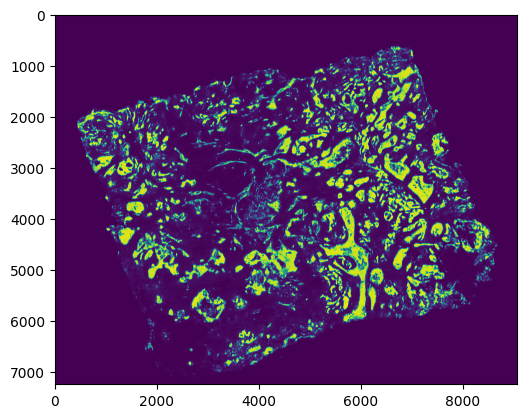

In [60]:
x = tifffile.imread(
    '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z110_C18.tif'
)
plt.imshow(x)

In [62]:
positions = sorted(sid_to_z.values())
z_to_idx = {v:positions.index(v) for v in sid_to_z.values()}

In [72]:
# fill in blanks
fps = sorted(utils.listfiles(combined_dir, regex=r'tif$'))
names = [fp.split('/')[-1] for fp in fps]
names

['image_Z0_C0.tif',
 'image_Z0_C1.tif',
 'image_Z0_C10.tif',
 'image_Z0_C11.tif',
 'image_Z0_C12.tif',
 'image_Z0_C13.tif',
 'image_Z0_C14.tif',
 'image_Z0_C15.tif',
 'image_Z0_C16.tif',
 'image_Z0_C17.tif',
 'image_Z0_C18.tif',
 'image_Z0_C2.tif',
 'image_Z0_C3.tif',
 'image_Z0_C4.tif',
 'image_Z0_C5.tif',
 'image_Z0_C6.tif',
 'image_Z0_C7.tif',
 'image_Z0_C8.tif',
 'image_Z0_C9.tif',
 'image_Z105_C0.tif',
 'image_Z105_C1.tif',
 'image_Z105_C10.tif',
 'image_Z105_C11.tif',
 'image_Z105_C12.tif',
 'image_Z105_C13.tif',
 'image_Z105_C14.tif',
 'image_Z105_C15.tif',
 'image_Z105_C16.tif',
 'image_Z105_C17.tif',
 'image_Z105_C18.tif',
 'image_Z105_C2.tif',
 'image_Z105_C3.tif',
 'image_Z105_C4.tif',
 'image_Z105_C5.tif',
 'image_Z105_C6.tif',
 'image_Z105_C7.tif',
 'image_Z105_C8.tif',
 'image_Z105_C9.tif',
 'image_Z110_C0.tif',
 'image_Z110_C1.tif',
 'image_Z110_C10.tif',
 'image_Z110_C11.tif',
 'image_Z110_C12.tif',
 'image_Z110_C13.tif',
 'image_Z110_C14.tif',
 'image_Z110_C15.tif',
 '

In [75]:
blank = np.zeros(target_size, dtype=np.uint8)
for z in [entry['position'] for entry in config['sections']]:
# for z in range(len(config['sections'])):
    for c in range(combined_channel_idx + 1):
        name = f'{root}_Z{z}_C{c}.tif'
        if name not in names:
#             print(name)
            tifffile.imwrite(combined_dir / name, blank, compression='LZW', ome=False, bigtiff=False)

(7250, 9063)


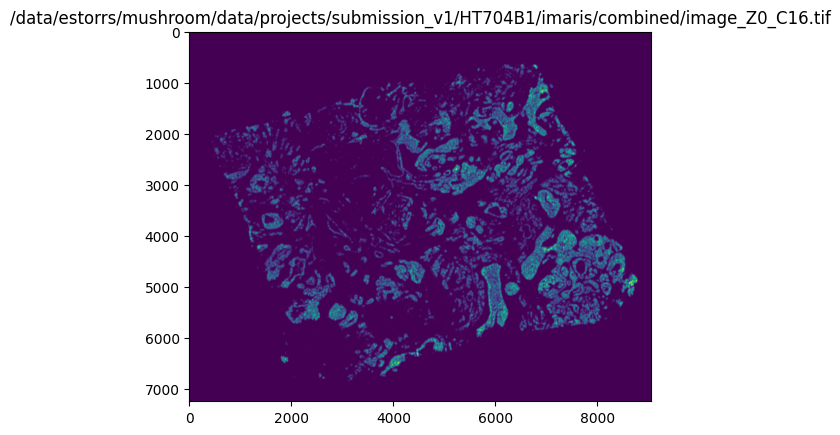

(7250, 9063)


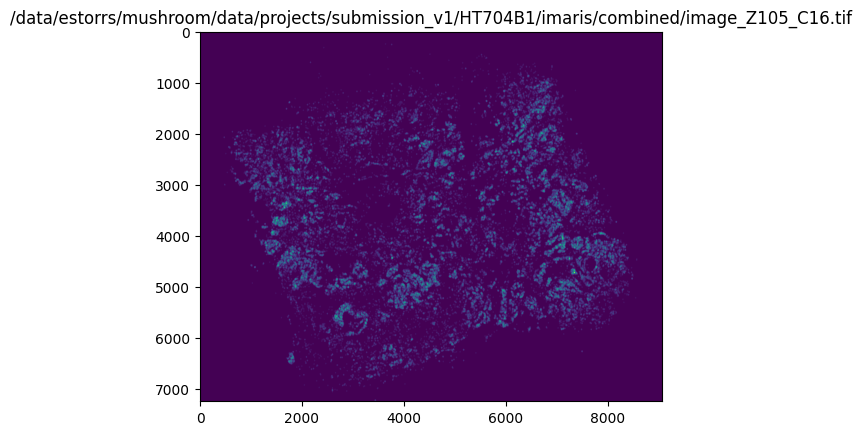

(7250, 9063)


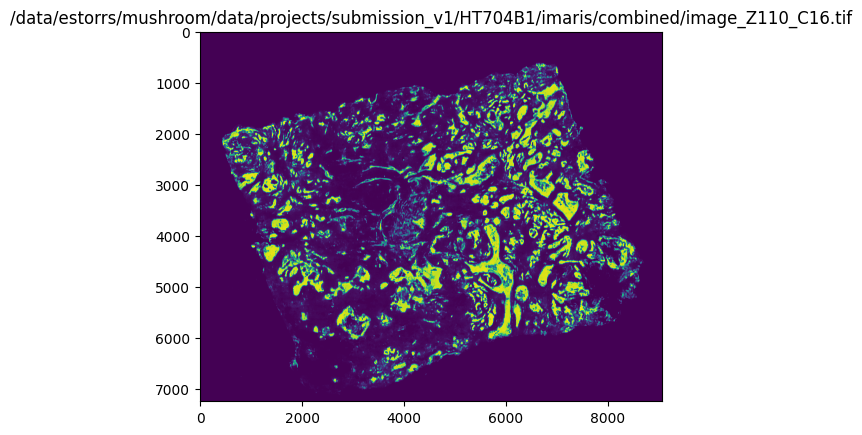

(7250, 9063)


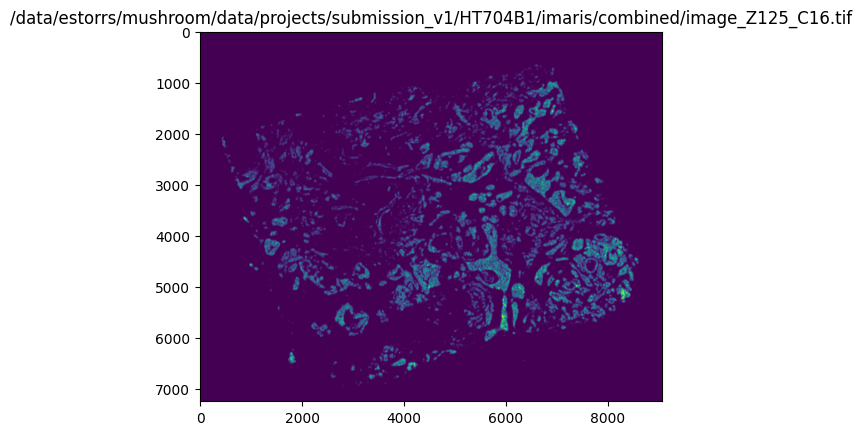

(7250, 9063)


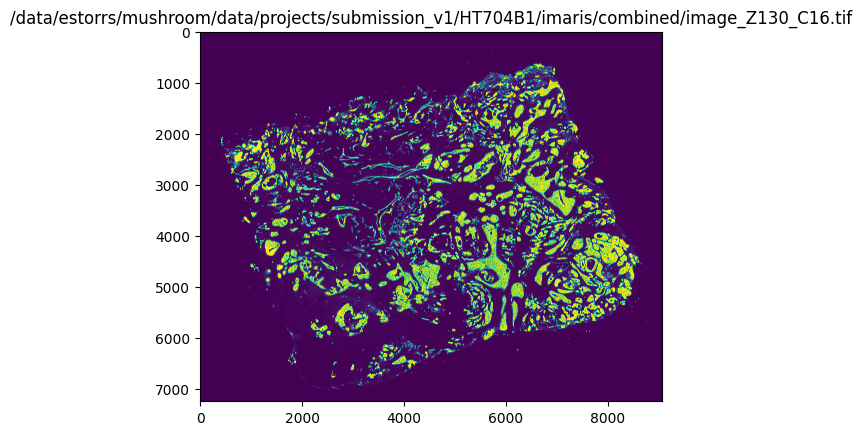

(7250, 9063)


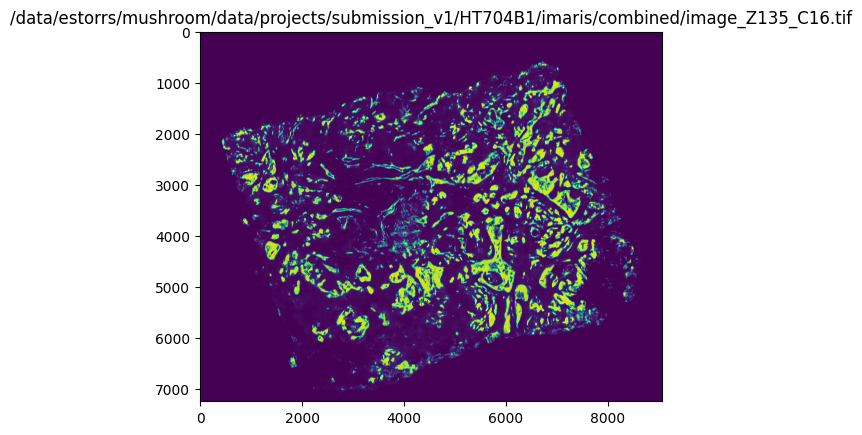

(7250, 9063)


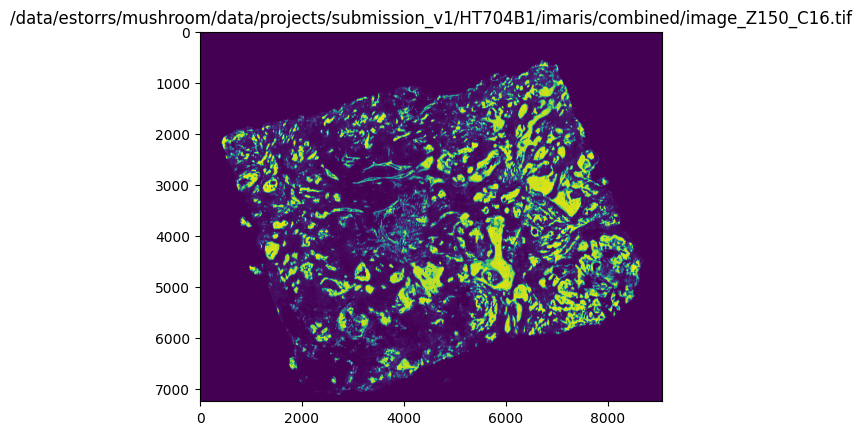

(7250, 9063)


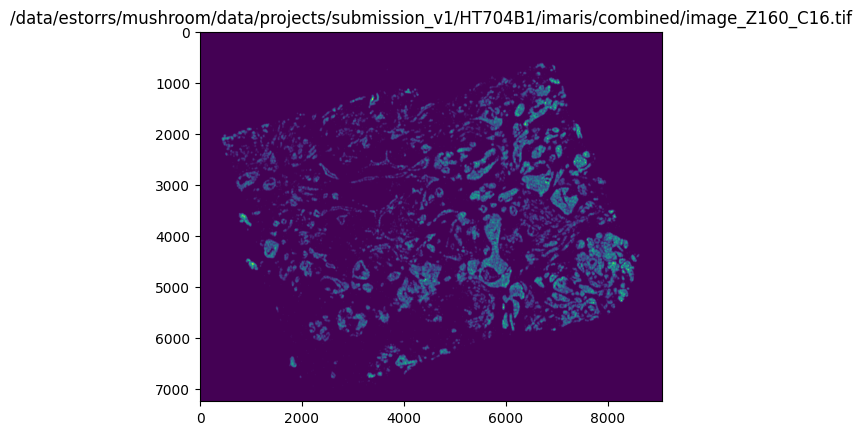

(7250, 9063)


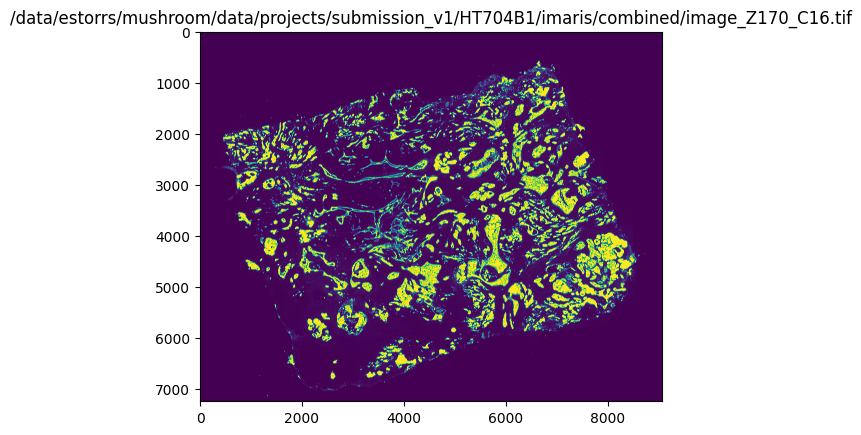

(7250, 9063)


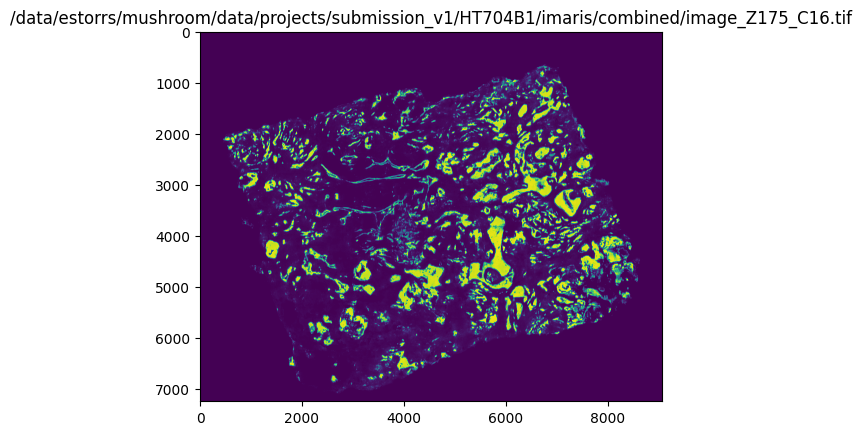

(7250, 9063)


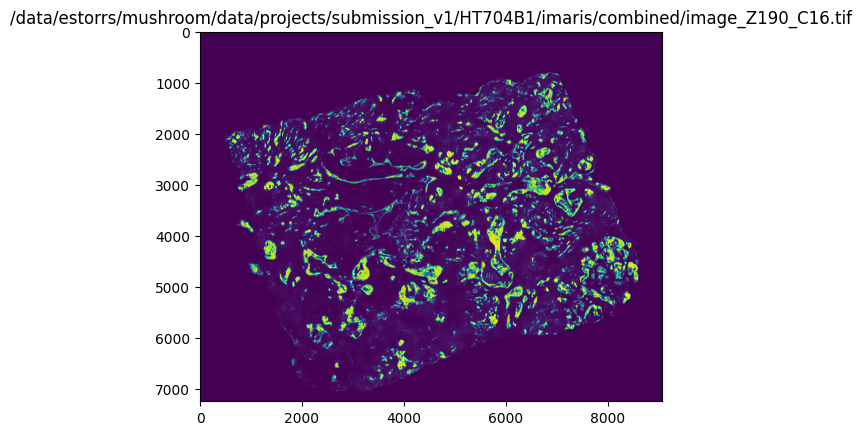

(7250, 9063)


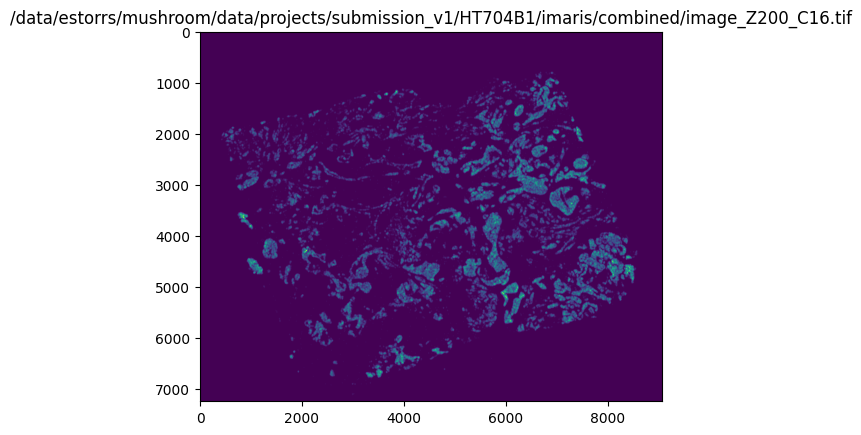

(7250, 9063)


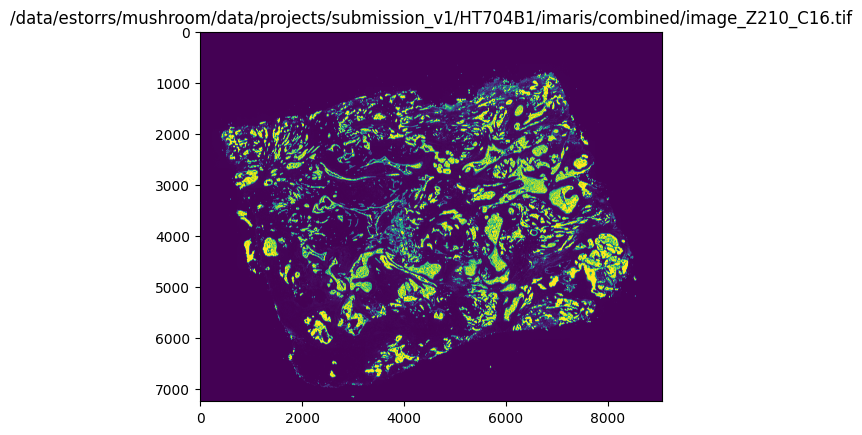

(7250, 9063)


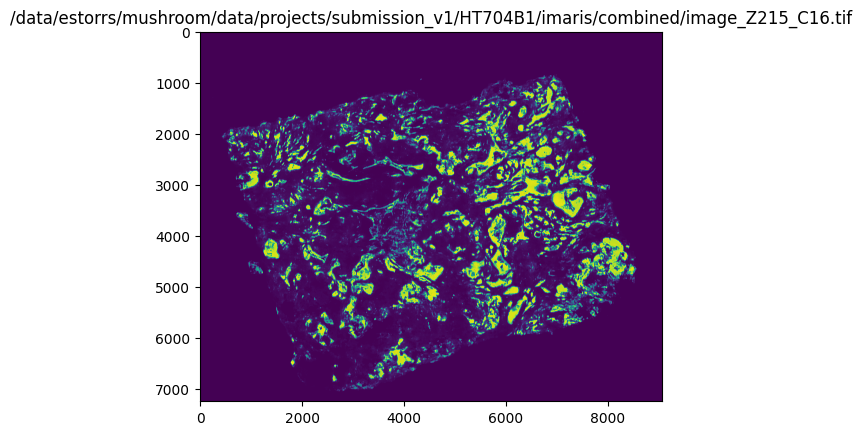

(7250, 9063)


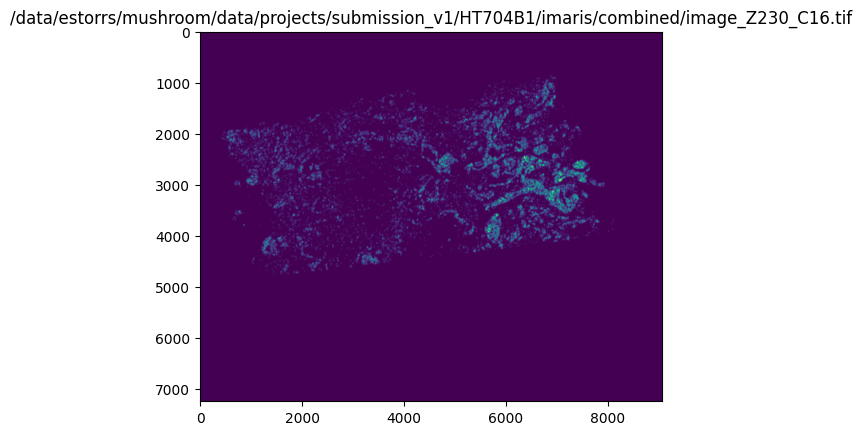

(7250, 9063)


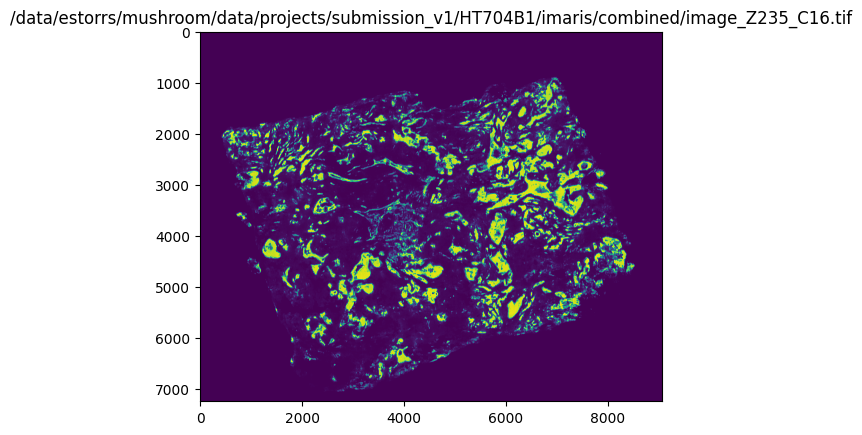

(7250, 9063)


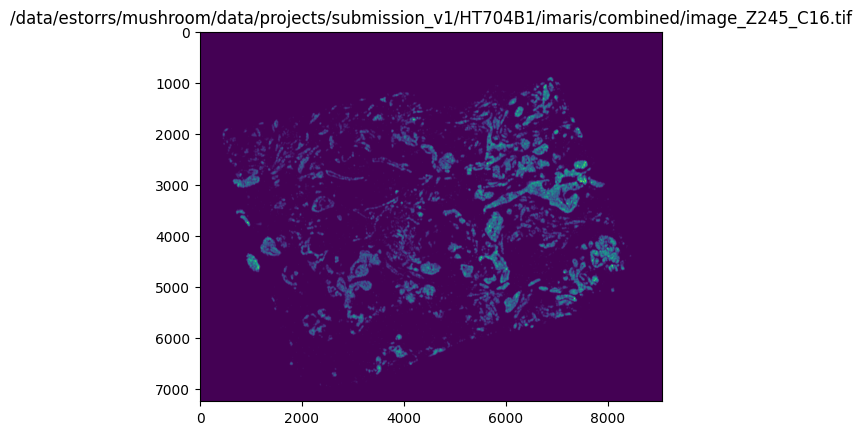

(7250, 9063)


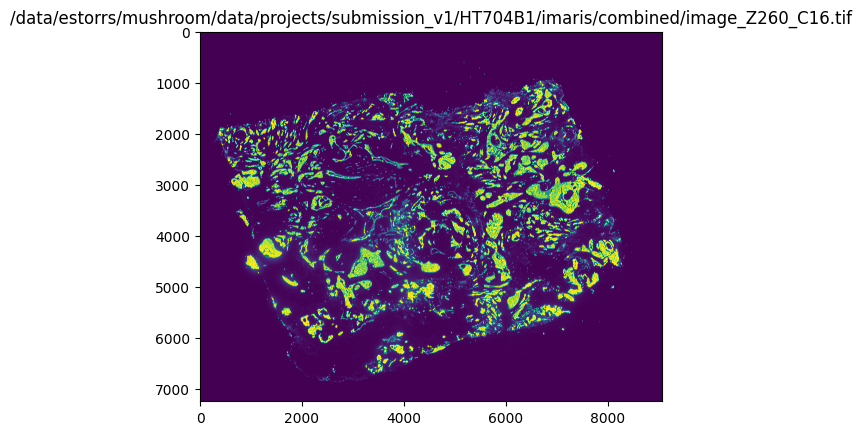

(7250, 9063)


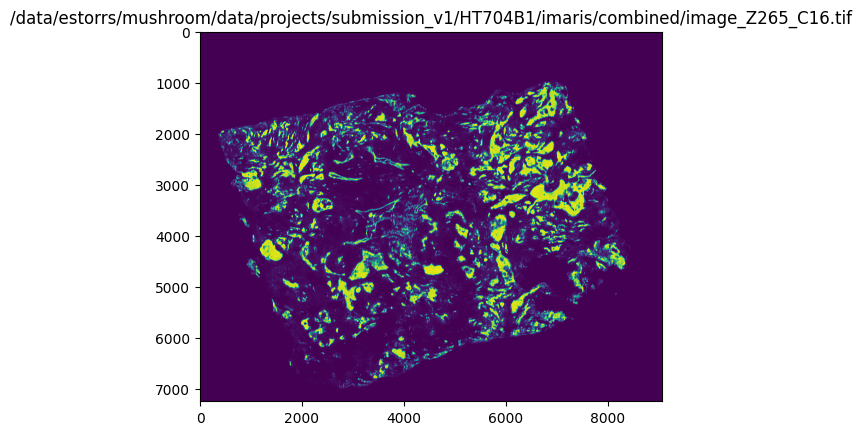

(7250, 9063)


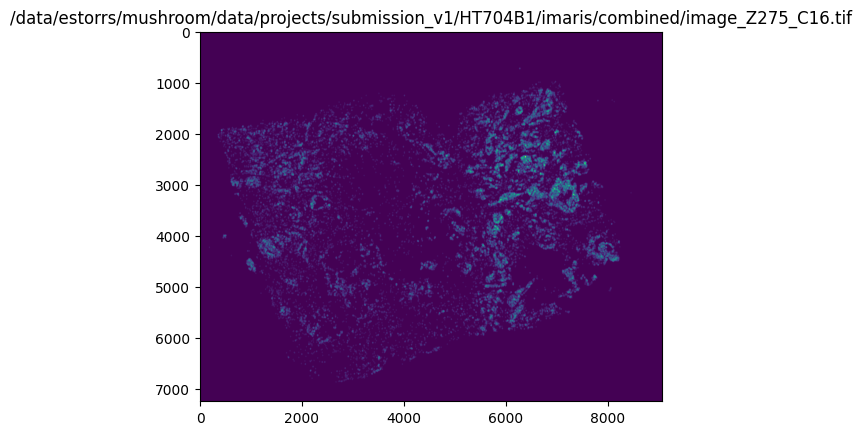

(7250, 9063)


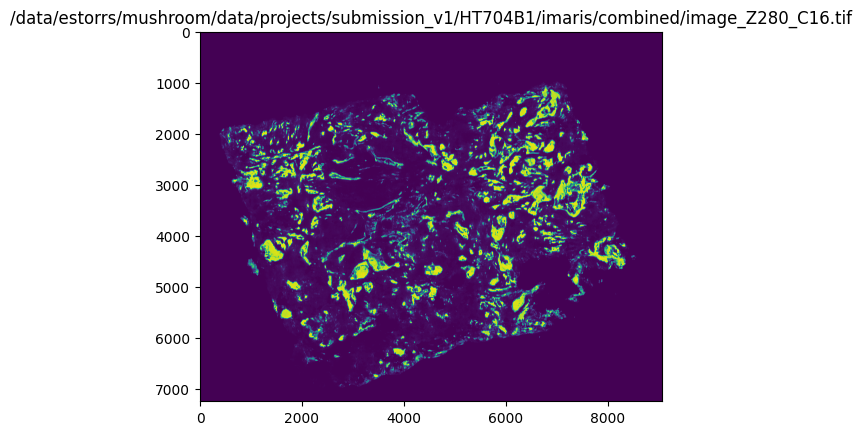

(7250, 9063)


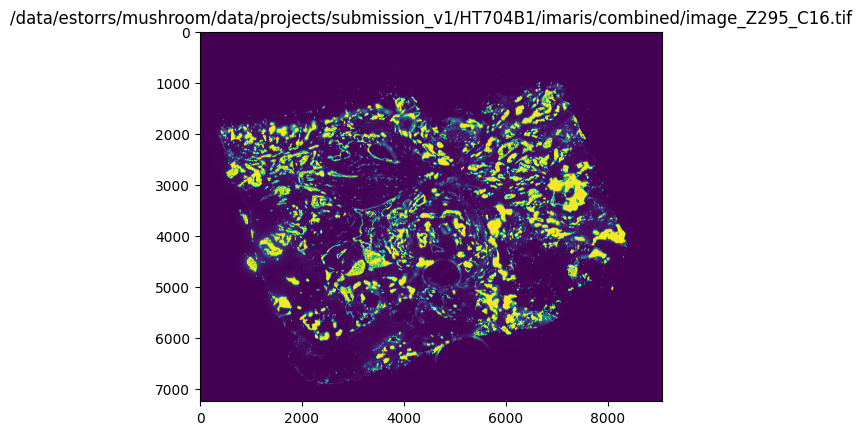

(7250, 9063)


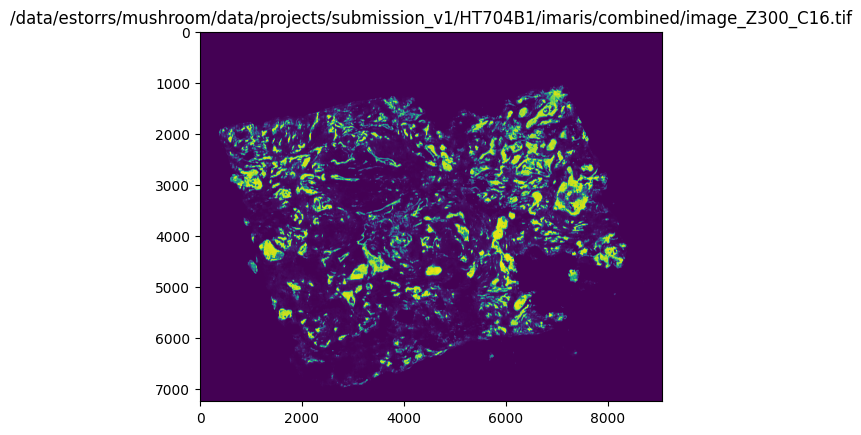

(7250, 9063)


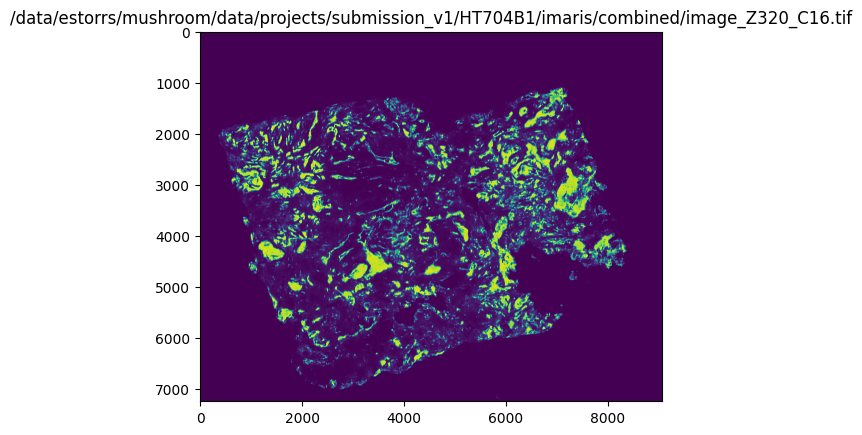

(7250, 9063)


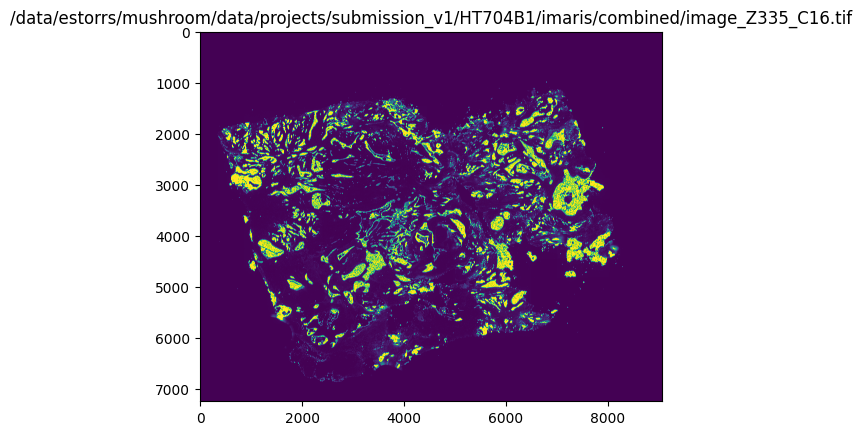

(7250, 9063)


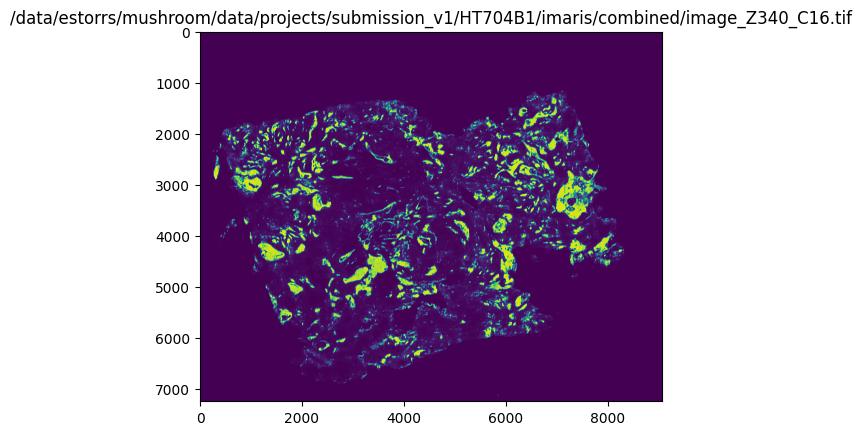

(7250, 9063)


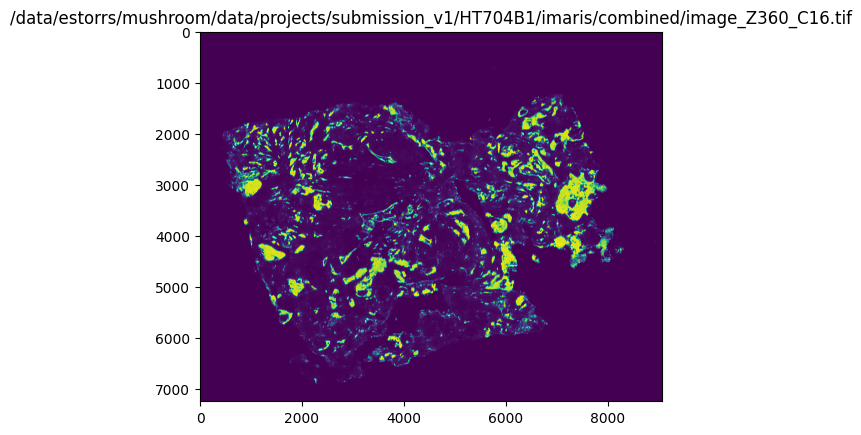

(7250, 9063)


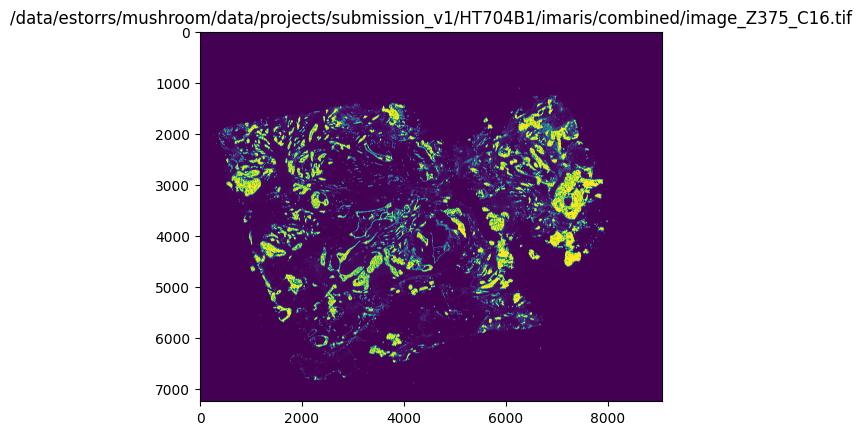

(7250, 9063)


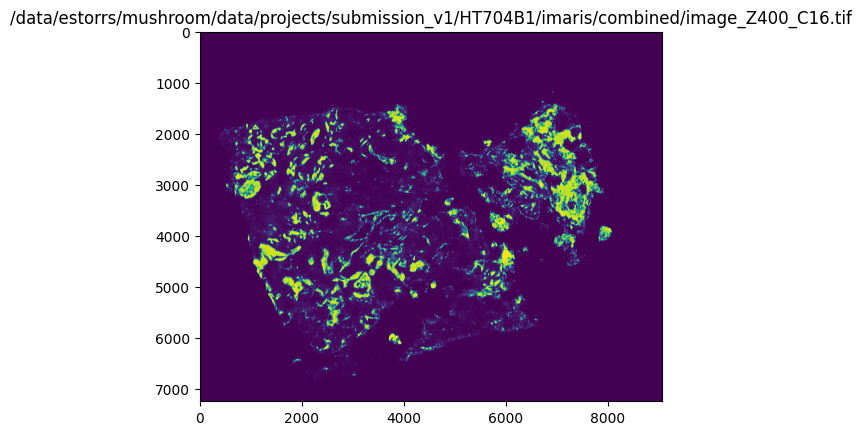

(7250, 9063)


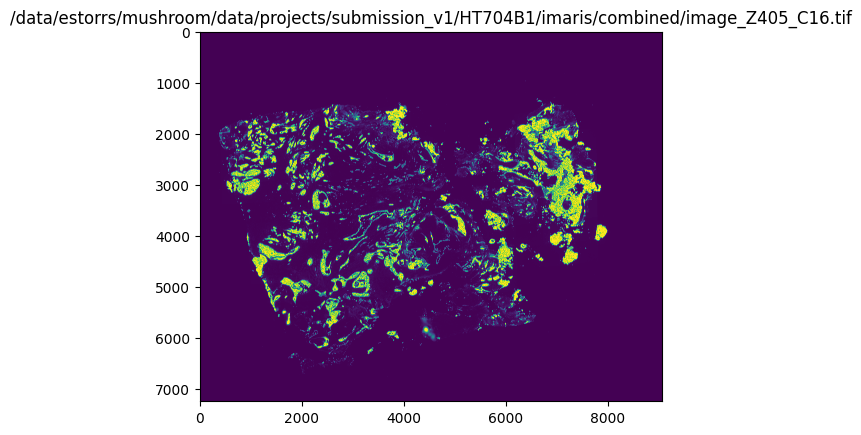

(7250, 9063)


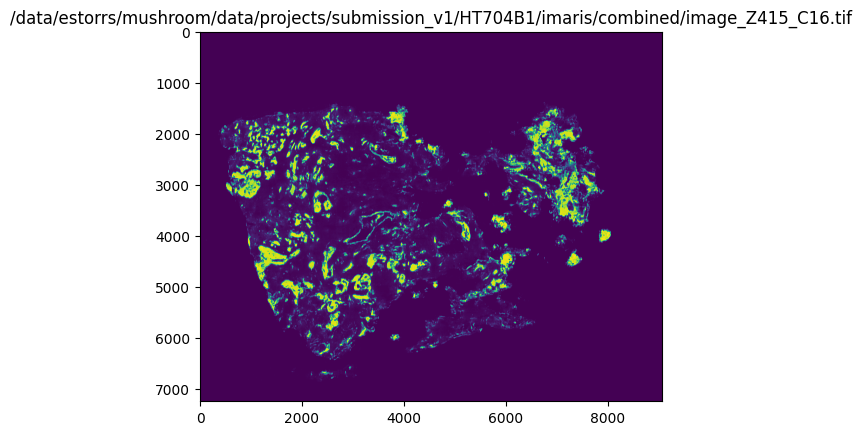

(7250, 9063)


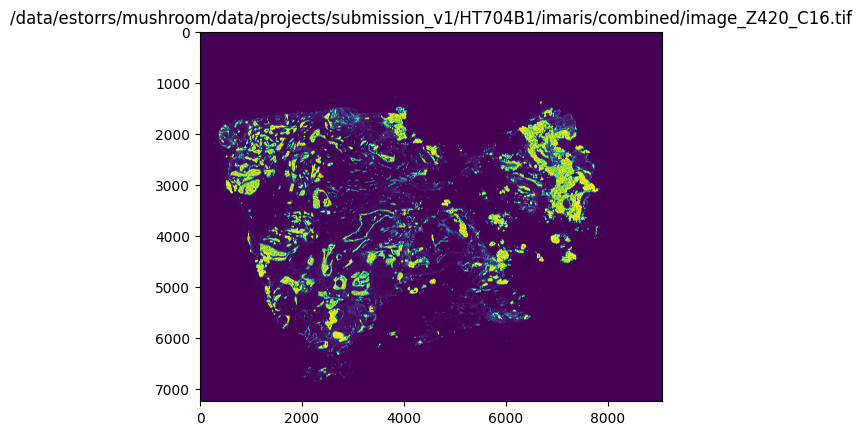

(7250, 9063)


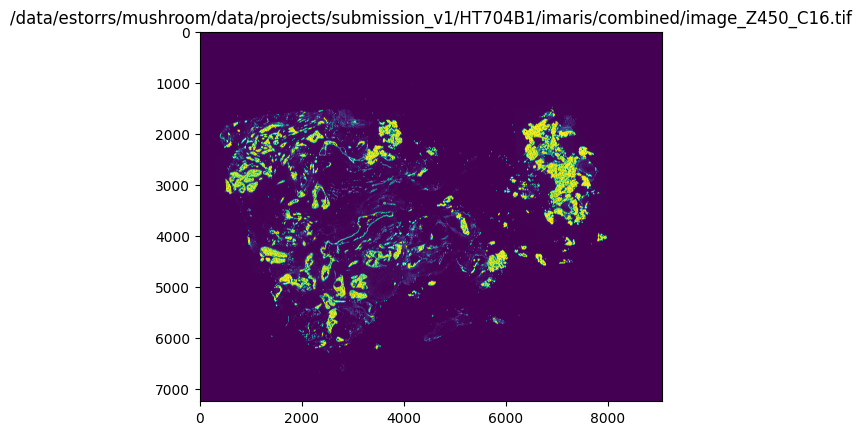

(7250, 9063)


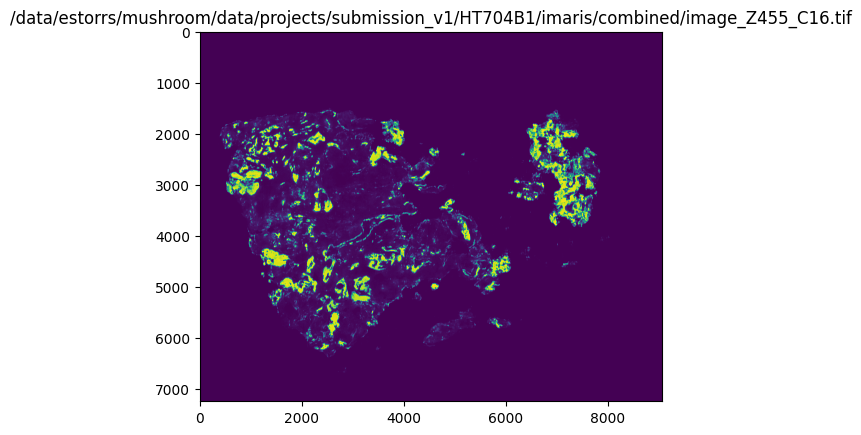

(7250, 9063)


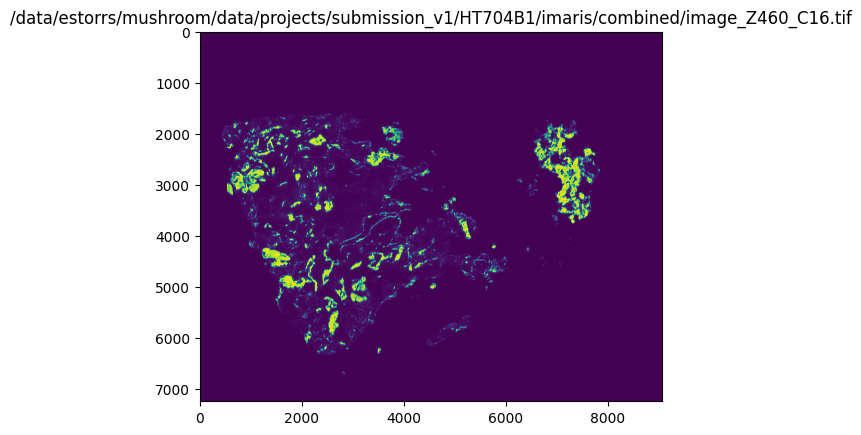

(7250, 9063)


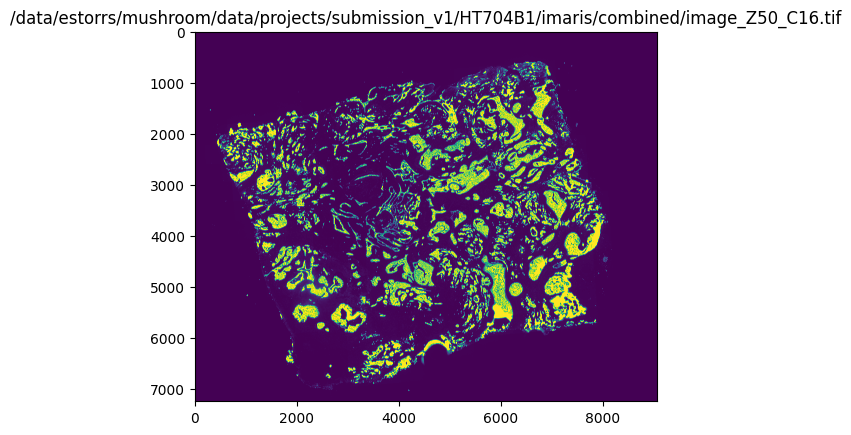

(7250, 9063)


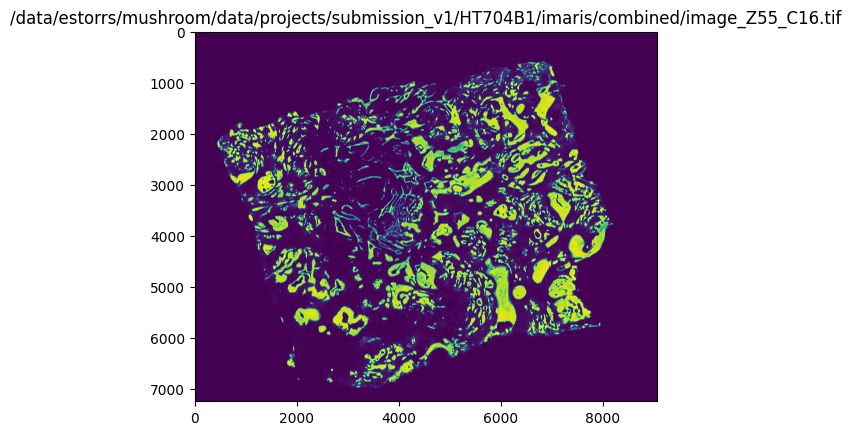

(7250, 9063)


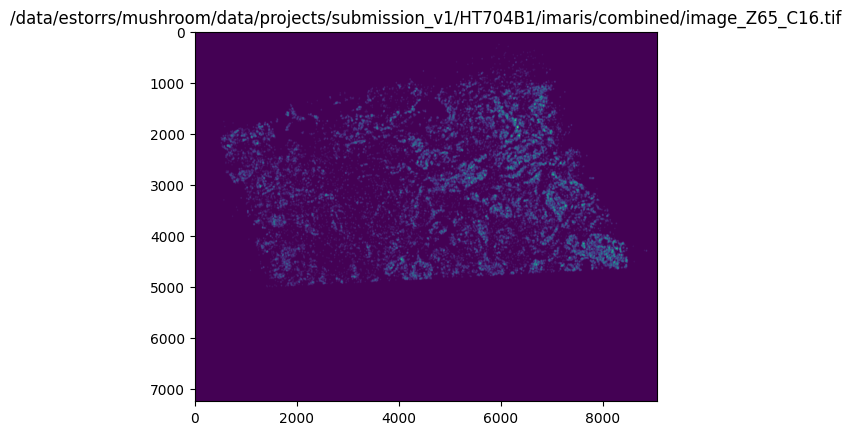

(7250, 9063)


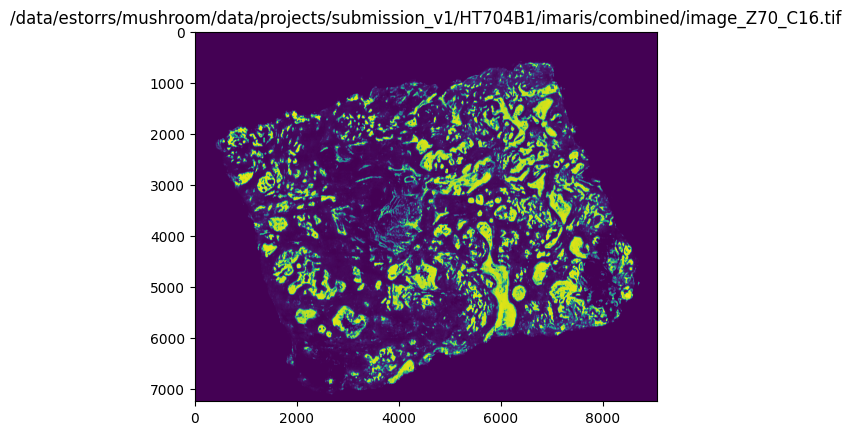

(7250, 9063)


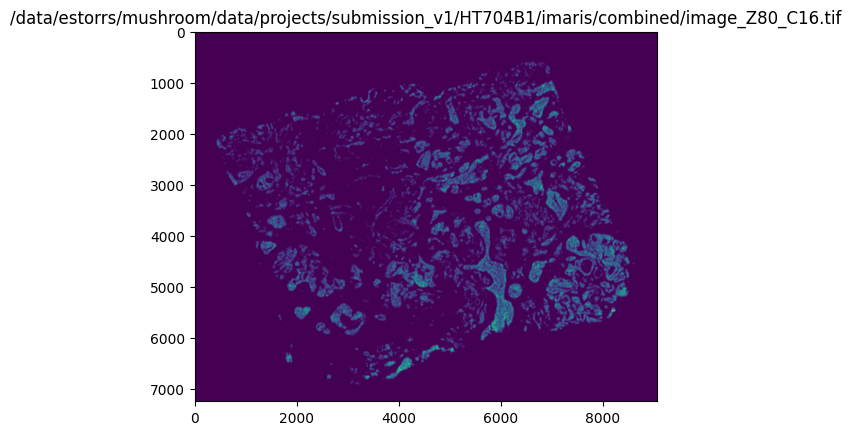

(7250, 9063)


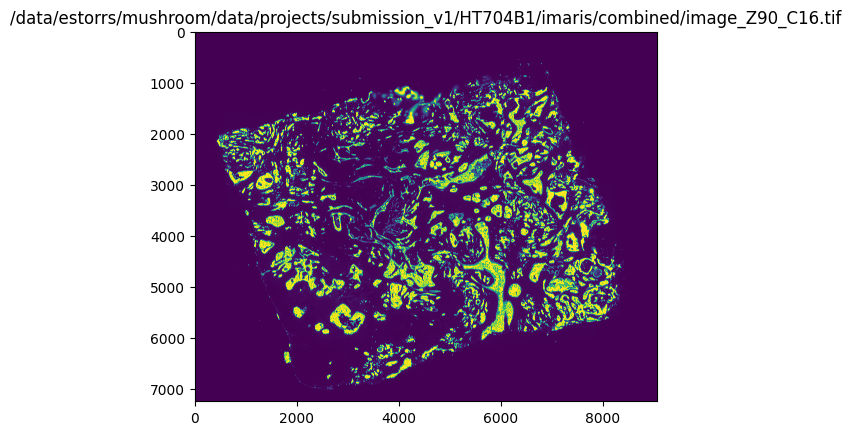

(7250, 9063)


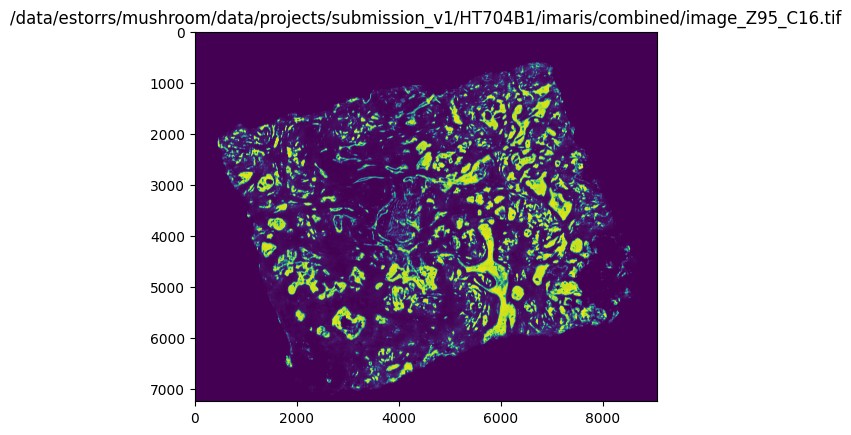

In [69]:
fps = sorted(utils.listfiles(combined_dir, regex=r'tif$'))
for fp in fps:
    if 'C16.tif' in fp:
        x = tifffile.imread(fp)
        print(x.shape)
        plt.imshow(x)
        plt.title(fp)
        plt.show()

In [50]:
# save an altered directory just in case
altered_dir = Path('/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined_stacked')
altered_dir.mkdir(parents=True, exist_ok=True)

fps = sorted(utils.listfiles(combined_dir))
for fp in fps:
    
    if 'metadata' not in fp:
        name = fp.split('/')[-1]
        position = int(re.sub(r'^.*Z([0-9]+).*$', r'\1', name))
        idx = z_to_idx[position]
        new_name = name.replace(f'Z{position}', f'Z{idx}')
        
        save_fp = altered_dir / new_name
        shutil.copy(fp, save_fp)


In [20]:
import shutil
shutil.rmtree(combined_dir)

In [ ]:
# fix predicted tiling
# blur xenium and cosmx